#### reference
opencv tutorial code : https://docs.opencv.org/3.4.3/dc/dc3/tutorial_py_matcher.html </br>
Type error: required argument 'outlmg' (pos6) not found : https://stackoverflow.com/questions/31631352/typeerror-required-argument-outimg-pos-6-not-found </br>
cv2.SIFT error : https://stackoverflow.com/questions/18561910/cant-use-surf-sift-in-opencv 


# Feature matching 
그림 비교 및 유사도 측정 </br>
유사도(Match Score) = (유사한 특징임을 설명해주는 feature spot 수 / 추출한 feature의 수) *100

In [4]:
import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt
import os




### Brute-Force Matching with SIFT Descriptors and Ratio Test

In [5]:
def fm_2(img1,img2):    
    # Initiate SIFT detector
    # SIFT detector code changed cv.SIFT() got error 
    original = cv.imread(img1,0)
    compare = cv.imread(img2,0)
    
    sift = cv.xfeatures2d.SIFT_create()
    
    ### flip compare image  
    original = cv.flip(original,1)
    compare = cv.flip(compare,1) # 1: left/right, 2: up/down
     
    # find the keypoints and descriptors with SIFT
    kp1, des1 = sift.detectAndCompute(original,None)
    kp2, des2 = sift.detectAndCompute(compare,None)

    # BFMatcher with default params
    bf = cv.BFMatcher()
    matches = bf.knnMatch(des1,des2, k=2)
    
    ###---- similarity plus----------###
    similarity = 0.0
    
    # Apply ratio test
    good = []
    for m,n in matches:
        if m.distance < 0.75*n.distance:
            good.append([m])
            similarity += 1.0
    
    if similarity == len(matches):
            similarity = 1.0
    elif similarity > 1.0:
            similarity = 1.0 - 1.0/similarity
    elif similarity == 1.0:
            similarity = 0.1
    else:
            similarity = 0.0
    ###-------------------------------###
            
    # cv.drawMatchesKnn expects list of lists as matches.
    plt.figure(figsize=(18,20))
    visual = cv.drawMatchesKnn(original,kp1,compare,kp2,good,None,flags=2)

    ## 추가         
    number_keypoints = 0
    if len(kp1) <= len(kp2):
        number_keypoints = len(kp1)
    else:
        number_keypoints = len(kp2)


    return ("Match Score: %s" 
            %(len(good) / number_keypoints * 100),
            "Similarity: %s"%similarity)      

In [6]:
# with data 
path_dir = "..\\picture\\com_set2"
file_list = os.listdir(path_dir)

for i,j in enumerate(file_list):
    if i+1 >= len(file_list):
        break
    else: 
        print(fm_2(path_dir+"\\"+j,path_dir+"\\"+file_list[i+1]))
    if i+2 >= len(file_list):
        break 
    else:
        print(fm_2(path_dir+"\\"+j,path_dir+"\\"+file_list[i+2]))
    if i+3 >= len(file_list):
        break 
    else:
        print(fm_2(path_dir+"\\"+j,path_dir+"\\"+file_list[i+3]))
    if i+4 >= len(file_list):
        break 
    else:
        print(fm_2(path_dir+"\\"+j,path_dir+"\\"+file_list[i+4]))
    if i+5 >= len(file_list):
        break 
    else:
        print(fm_2(path_dir+"\\"+j,path_dir+"\\"+file_list[i+4]))
    

('Match Score: 22.30971128608924', 'Similarity: 0.9882352941176471')
('Match Score: 9.711286089238845', 'Similarity: 0.972972972972973')
('Match Score: 10.655737704918032', 'Similarity: 0.9615384615384616')
('Match Score: 6.299212598425196', 'Similarity: 0.9583333333333334')
('Match Score: 6.299212598425196', 'Similarity: 0.9583333333333334')
('Match Score: 8.454810495626822', 'Similarity: 0.9827586206896551')
('Match Score: 15.573770491803279', 'Similarity: 0.9736842105263158')
('Match Score: 8.709175738724728', 'Similarity: 0.9821428571428571')
('Match Score: 8.56610800744879', 'Similarity: 0.9782608695652174')


<Figure size 1296x1440 with 0 Axes>

<Figure size 1296x1440 with 0 Axes>

<Figure size 1296x1440 with 0 Axes>

<Figure size 1296x1440 with 0 Axes>

<Figure size 1296x1440 with 0 Axes>

<Figure size 1296x1440 with 0 Axes>

<Figure size 1296x1440 with 0 Axes>

<Figure size 1296x1440 with 0 Axes>

<Figure size 1296x1440 with 0 Axes>

In [7]:
path_dir_1 = "..\\picture\\com_set2"
path_dir_2 = "..\\picture\\com_set3"
file_list_1 = os.listdir(path_dir_1)
file_list_2 = os.listdir(path_dir_2)

for i,j in enumerate(file_list_1):
    if i+1 >= len(file_list_1):
        break
    else: 
        print(fm_2(path_dir_1+"\\"+j, path_dir_2+"\\"+file_list_2[i+1]))
    if i+2 >= len(file_list):
        break 
    else:
        print(fm_2(path_dir_1+"\\"+j, path_dir_2+"\\"+file_list_2[i+2]))
    if i+3 >= len(file_list):
        break 
    else:
        print(fm_2(path_dir_1+"\\"+j, path_dir_2+"\\"+file_list_2[i+3]))
    if i+4 >= len(file_list):
        break 
    else:
        print(fm_2(path_dir_1+"\\"+j, path_dir_2+"\\"+file_list_2[i+4]))

('Match Score: 3.937007874015748', 'Similarity: 0.9333333333333333')
('Match Score: 4.986876640419948', 'Similarity: 0.9473684210526316')
('Match Score: 10.460251046025103', 'Similarity: 0.96')
('Match Score: 8.398950131233596', 'Similarity: 0.96875')
('Match Score: 2.7696793002915454', 'Similarity: 0.9473684210526316')
('Match Score: 14.225941422594143', 'Similarity: 0.9705882352941176')
('Match Score: 5.430711610486892', 'Similarity: 0.9655172413793104')


IndexError: list index out of range

<Figure size 1296x1440 with 0 Axes>

<Figure size 1296x1440 with 0 Axes>

<Figure size 1296x1440 with 0 Axes>

<Figure size 1296x1440 with 0 Axes>

<Figure size 1296x1440 with 0 Axes>

<Figure size 1296x1440 with 0 Axes>

<Figure size 1296x1440 with 0 Axes>



### FLANN based Matcher

In [9]:
FLANN_INDEX_KDTREE = 1
index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)

In [10]:
FLANN_INDEX_LSH = 6
index_params= dict(algorithm = FLANN_INDEX_LSH,
                   table_number = 6, # 12
                   key_size = 12,     # 20
                   multi_probe_level = 1) #2

In [8]:
def fm_3(img1,img2):
    original = cv.imread(img1,0)
    compare = cv.imread(img2,0)

    ### flip compare image
    original = cv.flip(original,1)
    compare = cv.flip(compare,1) # 1 : left/right, 0 : up/down

    # Initiate SIFT detector
    sift = cv.xfeatures2d.SIFT_create()

    # find the keypoints and descriptors with SIFT
    kp1, des1 = sift.detectAndCompute(original,None)
    kp2, des2 = sift.detectAndCompute(compare,None)

    # FLANN parameters
    FLANN_INDEX_KDTREE = 1
    index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)
    search_params = dict(checks=100)   # or pass empty dictionary
    flann = cv.FlannBasedMatcher(index_params,search_params)
    matches = flann.knnMatch(des1,des2,k=2) # 2순위 매칭 결과까지 취함 

    # Need to draw only good matches, so create a mask
    matchesMask = [[0,0] for i in range(len(matches))]
    good = []

    ## 추가 
    number_keypoints = 0
    if len(kp1) <= len(kp2):
        number_keypoints = len(kp1)
    else :
        number_keypoints = len(kp2)
    ###---- similarity plus----------###
    similarity = 0.0


    # ratio test as per Lowe's paper
    for i,(m,n) in enumerate(matches):
        if m.distance < 0.7*n.distance:
            matchesMask[i]=[1,0]
            good.append(m)
            similarity +=1.0
    
    # Apply ratio test
    if similarity == len(matches):
            similarity = 1.0
    elif similarity > 1.0:
            similarity = 1.0 - 1.0/similarity
    elif similarity == 1.0:
            similarity = 0.1
    else:
            similarity = 0.0
    ###-------------------------------###

    draw_params = dict(matchColor = (0,255,0),
                       singlePointColor = (255,0,0),
                       matchesMask = matchesMask,
                       flags = 0)

    visual = cv.drawMatchesKnn(original,kp1,compare,kp2,matches,None,**draw_params)

    plt.figure(figsize=(18,20))


    #     return ("Keypoints 1ST Image: " + str(len(kp1)), 
    #         "Keypoints 2ND Image: " + str(len(kp2)), 
    #         "GOOD Matches:%s" %len(good), 
    #         "Match Score: %s" %(len(good) / number_keypoints * 100),
    #         plt.imshow(visual))  
    return("match_score:%s"%(len(good) / number_keypoints * 100), "similarity:%s"%similarity)




### with similar

In [9]:
path_dir = "..\\picture\\com_set3"
file_list = os.listdir(path_dir)

#fm_3(path_dir+"\\"+file_list[0], path_dir+"\\"+file_list[1])
for i,j in enumerate(file_list):
    if i+1 >= len(file_list):
        break
    else: 
        print(fm_3(path_dir+"\\"+j,path_dir+"\\"+file_list[i+1]))

('match_score:6.529209621993128', 'similarity:0.9473684210526316')
('match_score:14.246196403872752', 'similarity:0.9902912621359223')
('match_score:16.736401673640167', 'similarity:0.975')
('match_score:19.665271966527197', 'similarity:0.9787234042553191')


<Figure size 1296x1440 with 0 Axes>

<Figure size 1296x1440 with 0 Axes>

<Figure size 1296x1440 with 0 Axes>

<Figure size 1296x1440 with 0 Axes>

### with different

In [10]:
path_dir_1 = "..\\picture\\com_set2"
path_dir_2 = "..\\picture\\com_set3"
file_list_1 = os.listdir(path_dir_1)
file_list_2 = os.listdir(path_dir_2)

for i,j in enumerate(file_list_1):
    if i+1 >= len(file_list_1):
        break
    else: 
        print(fm_3(path_dir_1+"\\"+j,path_dir_2+"\\"+file_list_2[i+1]))
    if i+2 >= len(file_list):
        break 
    else:
        print(fm_3(path_dir_1+"\\"+j,path_dir_2+"\\"+file_list_2[i+2]))
    if i+3 >= len(file_list):
        break 
    else:
        print(fm_3(path_dir_1+"\\"+j,path_dir_2+"\\"+file_list_2[i+3]))
    if i+4 >= len(file_list):
        break 
    else:
        print(fm_3(path_dir_1+"\\"+j,path_dir_2+"\\"+file_list_2[i+4]))

('match_score:2.8871391076115485', 'similarity:0.9090909090909091')
('match_score:3.4120734908136483', 'similarity:0.9230769230769231')
('match_score:8.368200836820083', 'similarity:0.95')
('match_score:7.086614173228346', 'similarity:0.962962962962963')
('match_score:1.3119533527696794', 'similarity:0.8888888888888888')
('match_score:10.0418410041841', 'similarity:0.9583333333333334')
('match_score:2.9962546816479403', 'similarity:0.9375')


<Figure size 1296x1440 with 0 Axes>

<Figure size 1296x1440 with 0 Axes>

<Figure size 1296x1440 with 0 Axes>

<Figure size 1296x1440 with 0 Axes>

<Figure size 1296x1440 with 0 Axes>

<Figure size 1296x1440 with 0 Axes>

<Figure size 1296x1440 with 0 Axes>

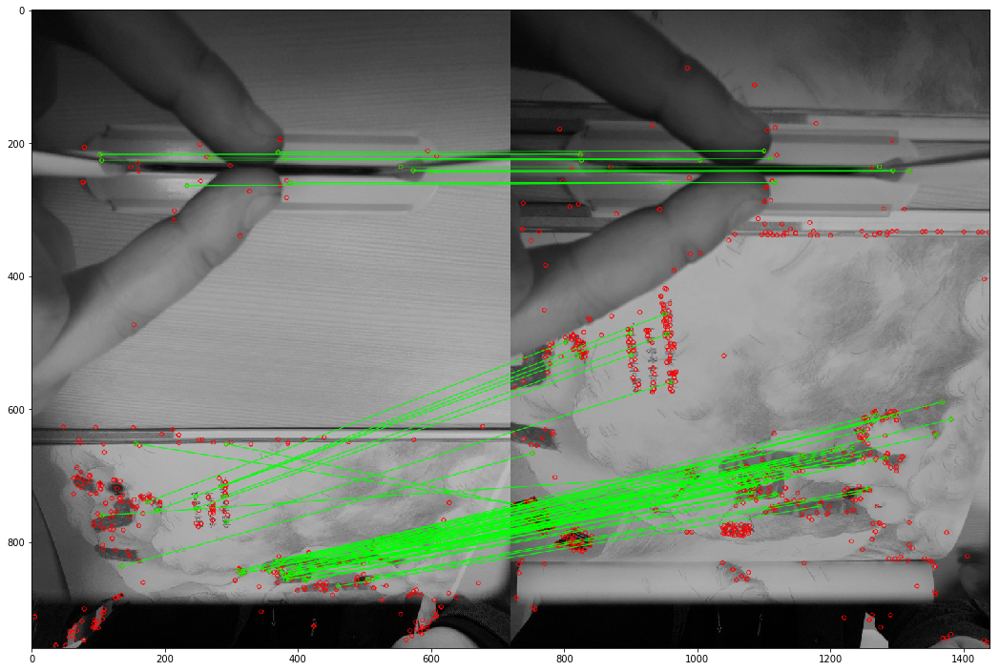

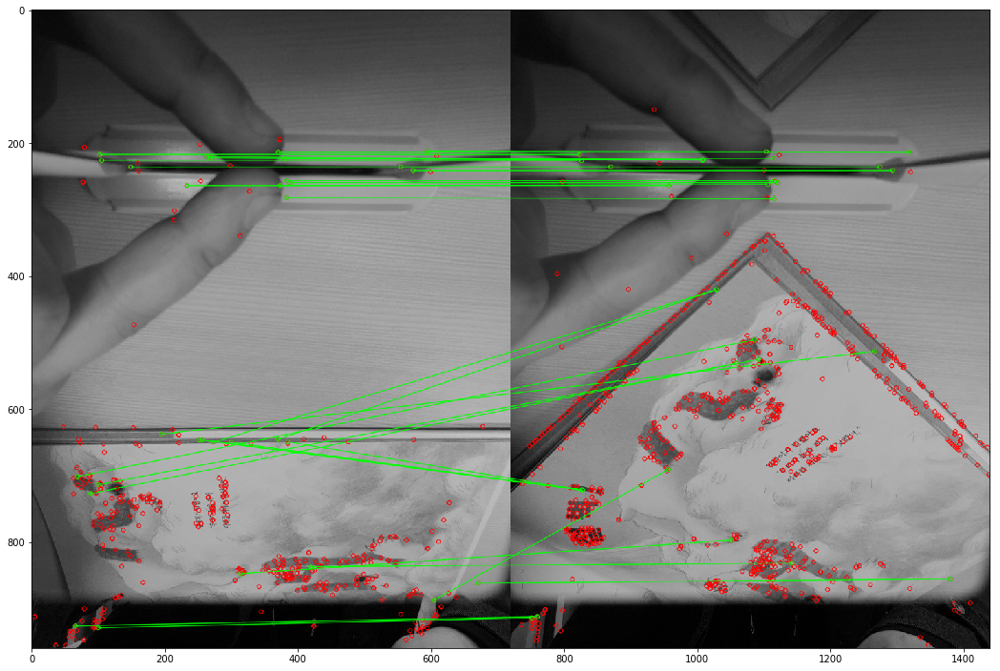

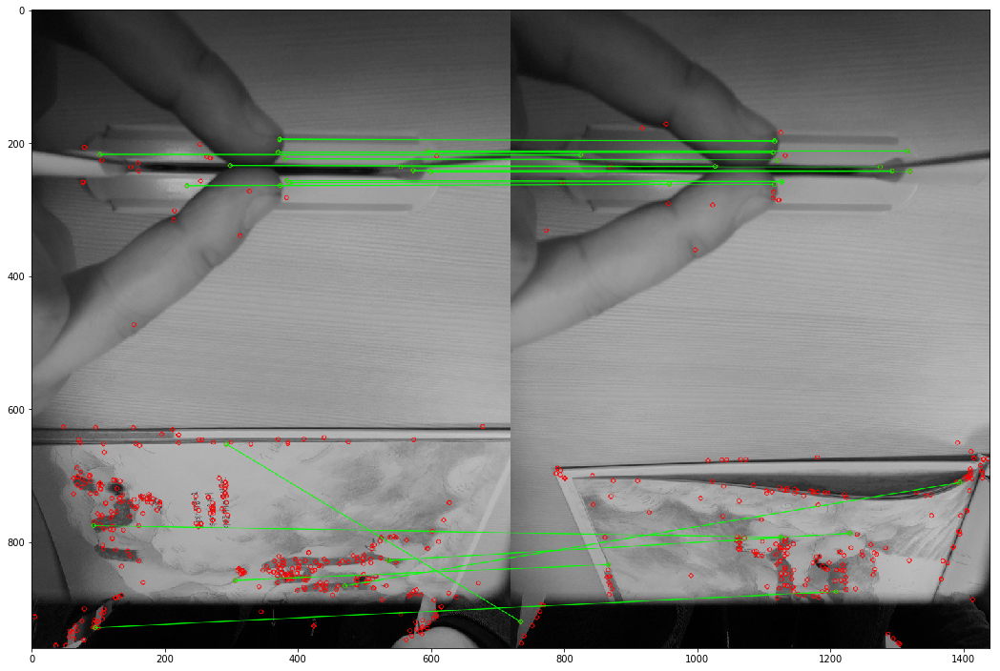

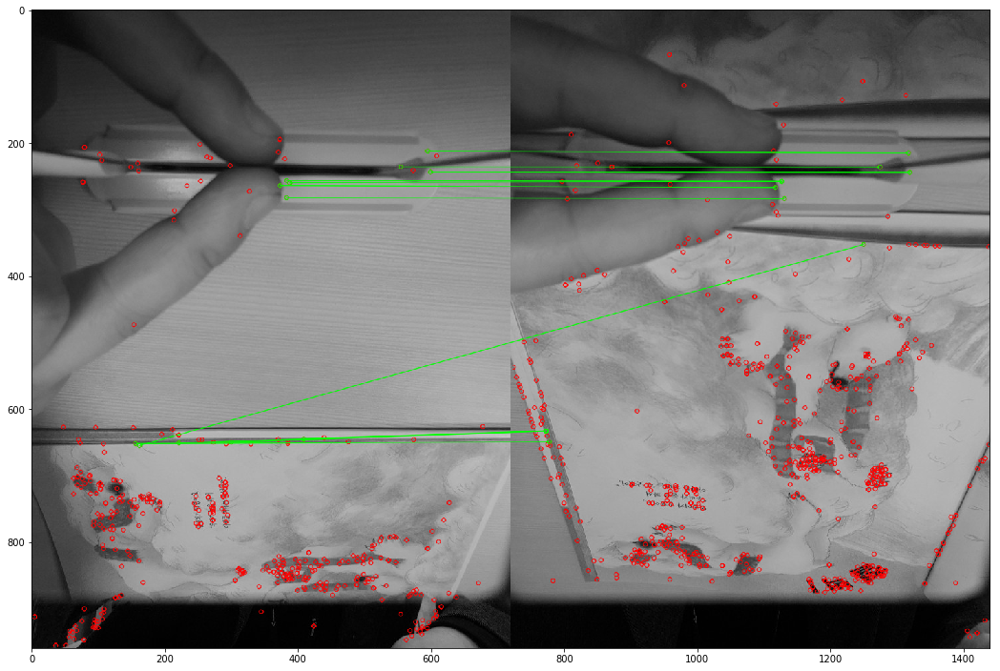

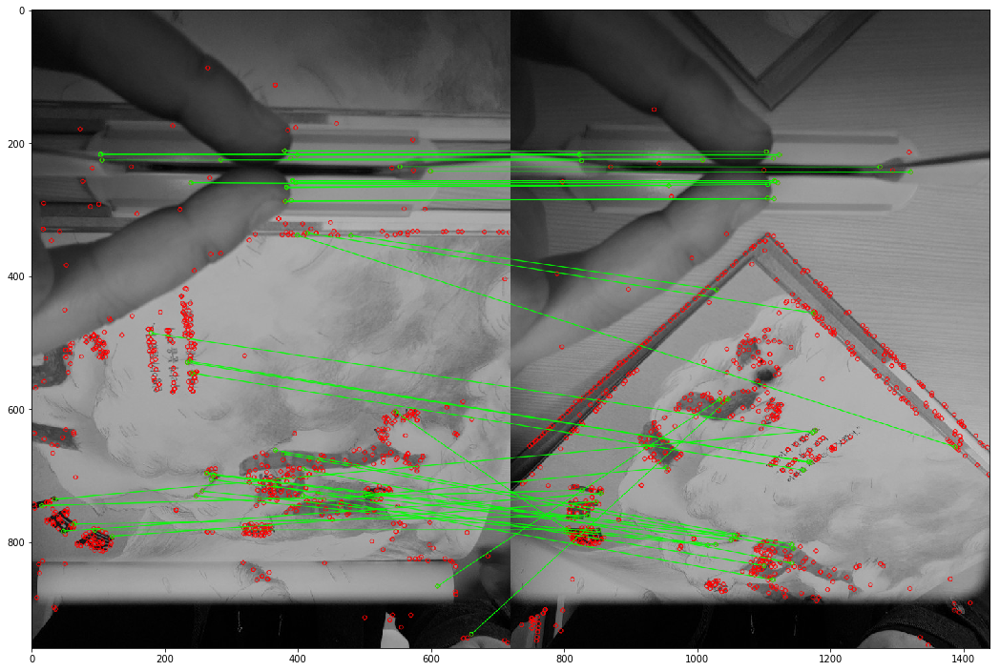

...

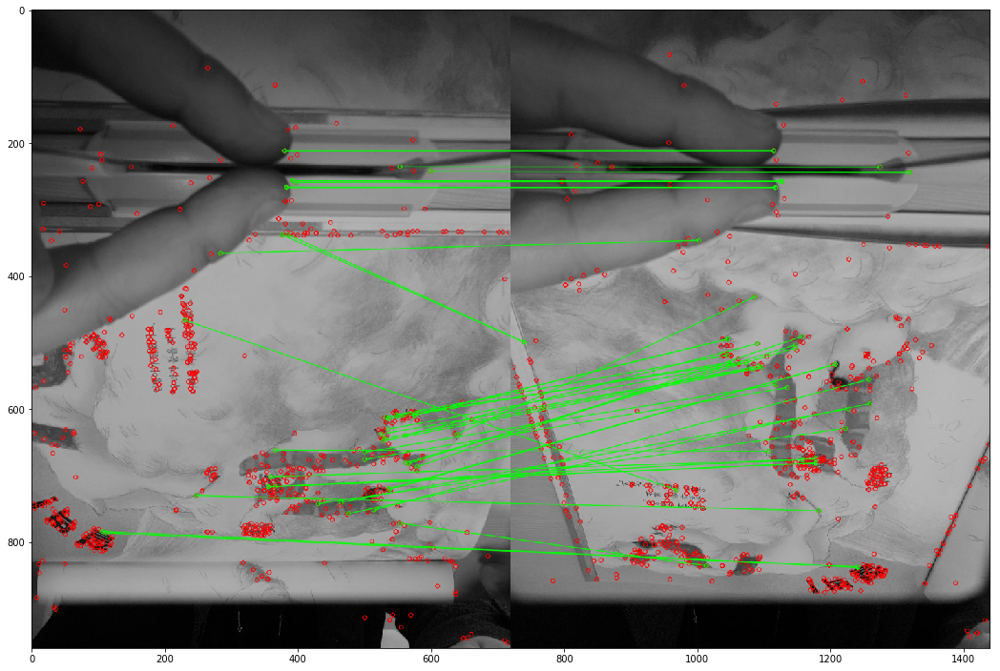

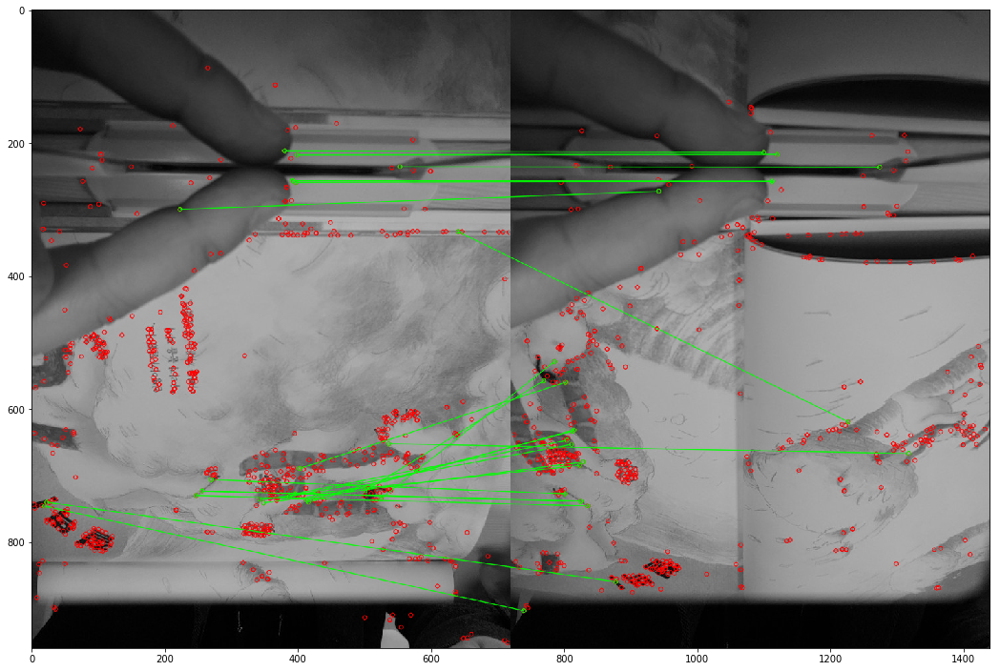

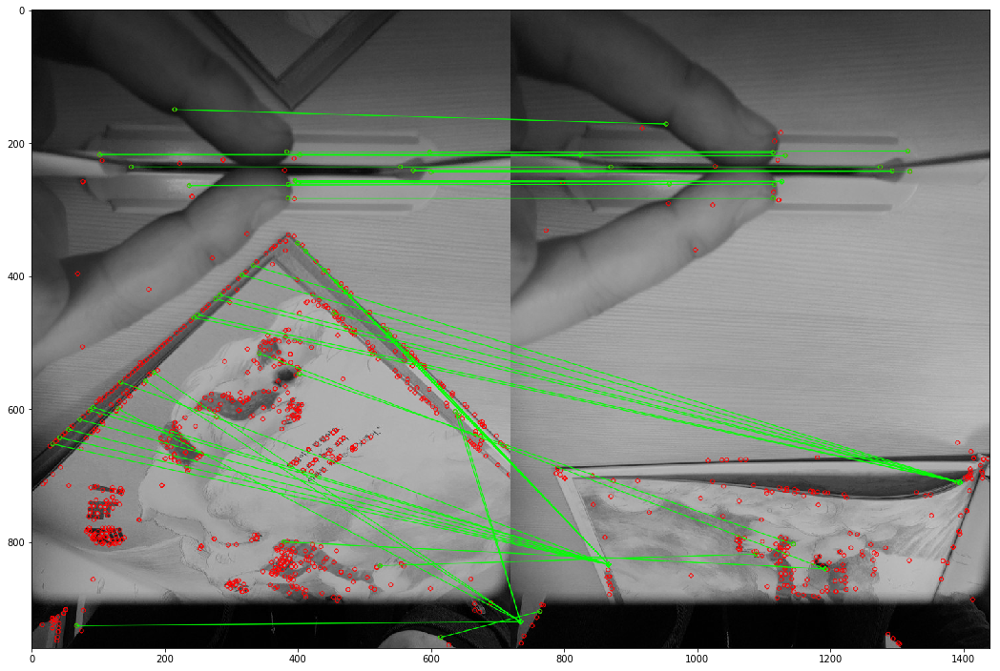

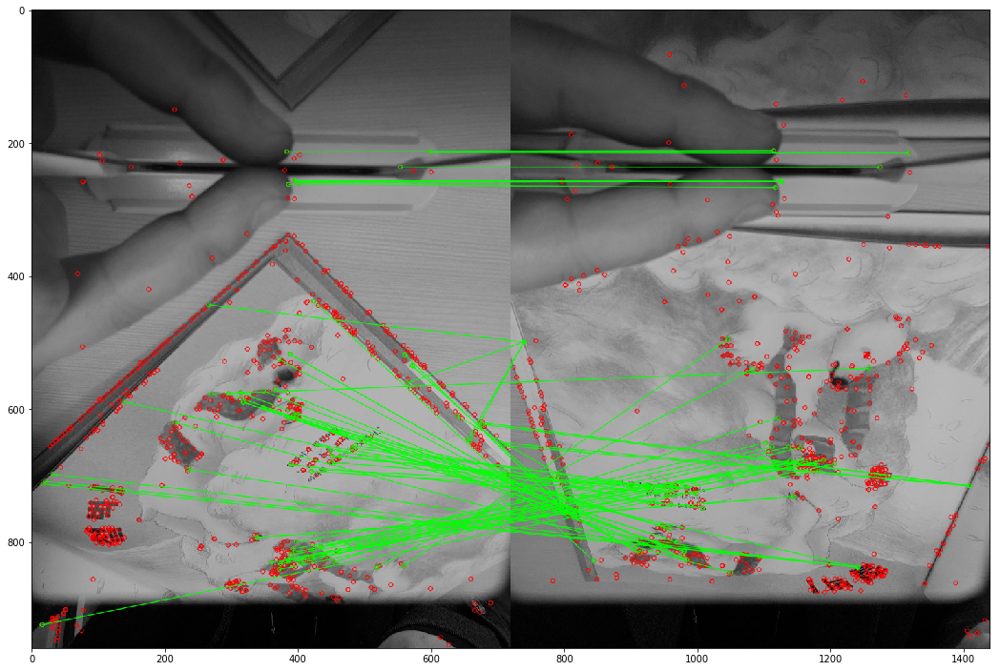

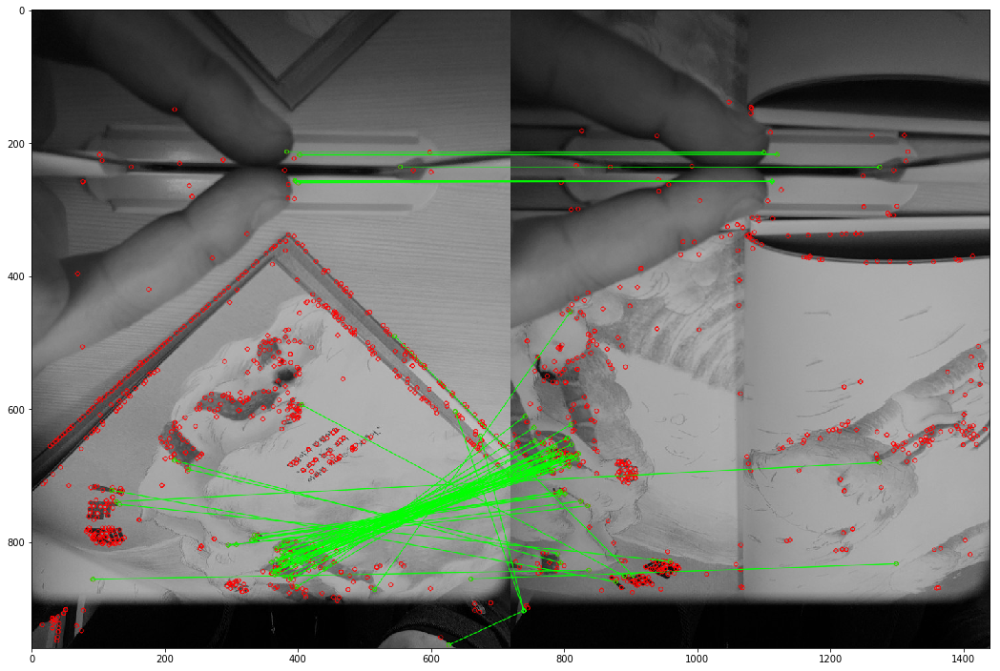

In [92]:
path_dir = "..\\picture\\com_set2"
file_list = os.listdir(path_dir)

for i,j in enumerate(file_list):
    if i+1 >= len(file_list):
        break
    else: 
        fm_3(path_dir+"\\"+j,path_dir+"\\"+file_list[i+1])
    if i+2 >= len(file_list):
        break 
    else:
        fm_3(path_dir+"\\"+j,path_dir+"\\"+file_list[i+2])
    if i+3 >= len(file_list):
        break 
    else:
        fm_3(path_dir+"\\"+j,path_dir+"\\"+file_list[i+3])
    if i+4 >= len(file_list):
        break 
    else:
        fm_3(path_dir+"\\"+j,path_dir+"\\"+file_list[i+4])
    

IndexError: list index out of range

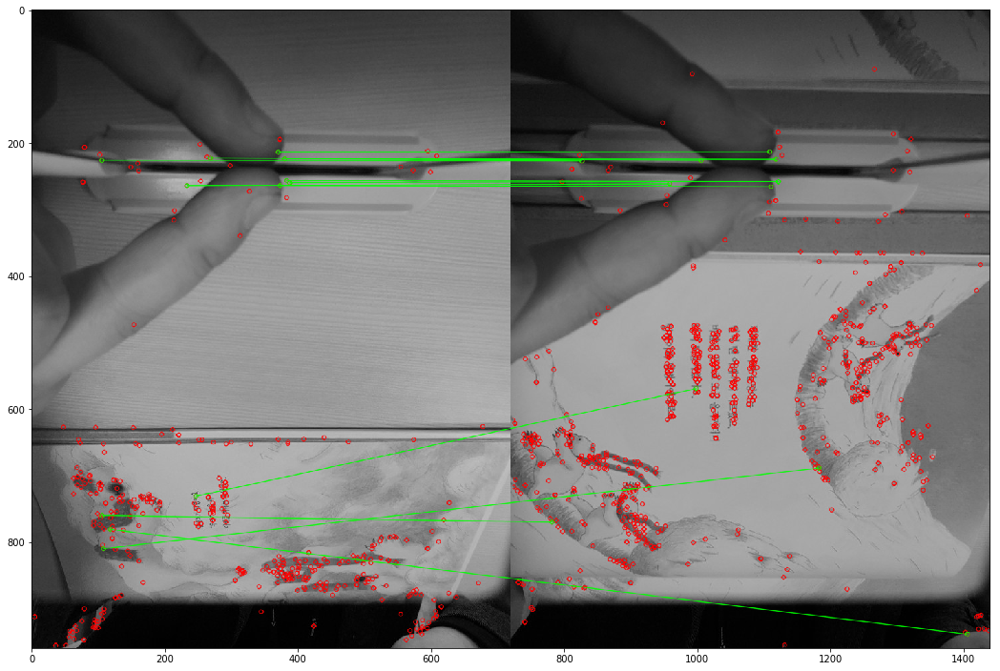

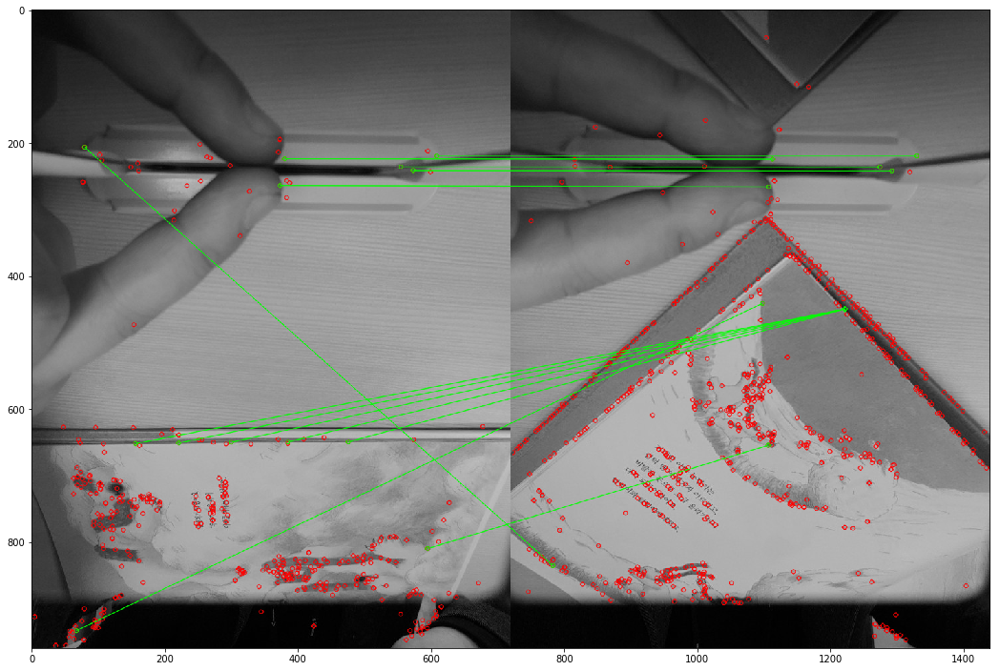

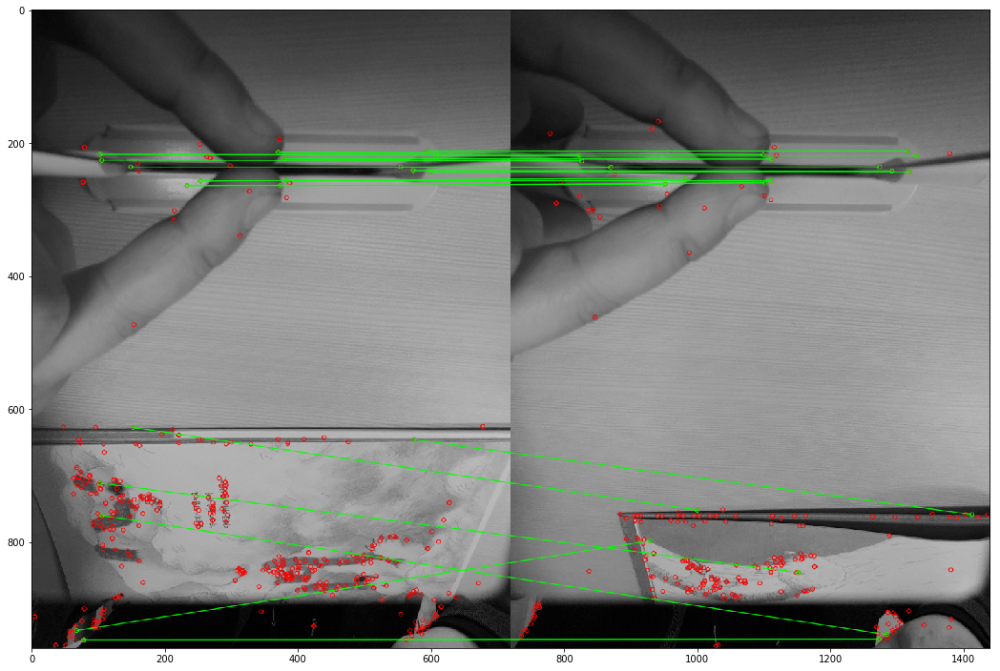

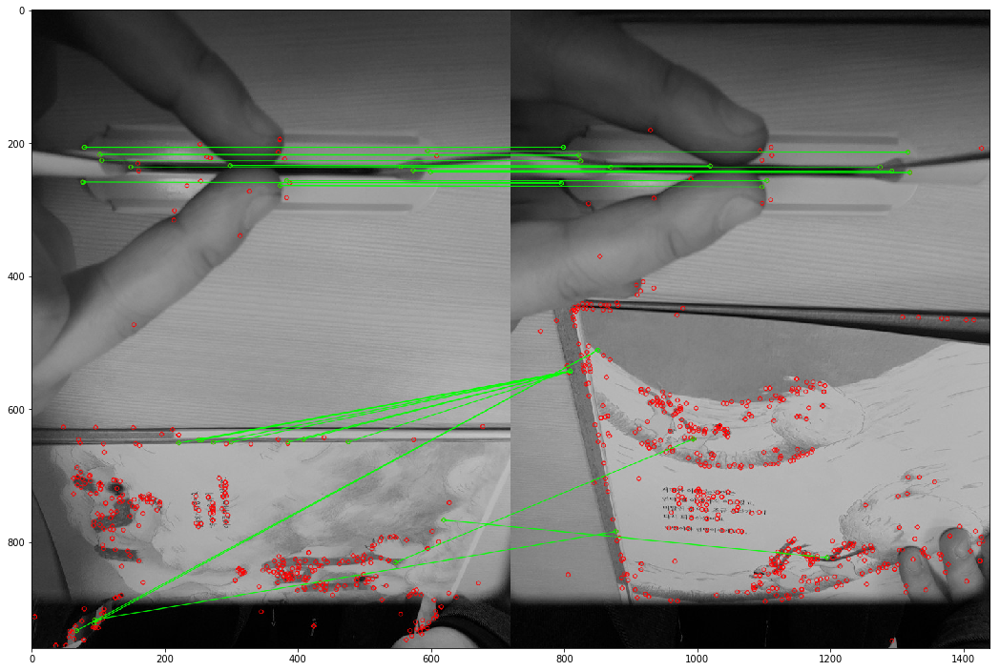

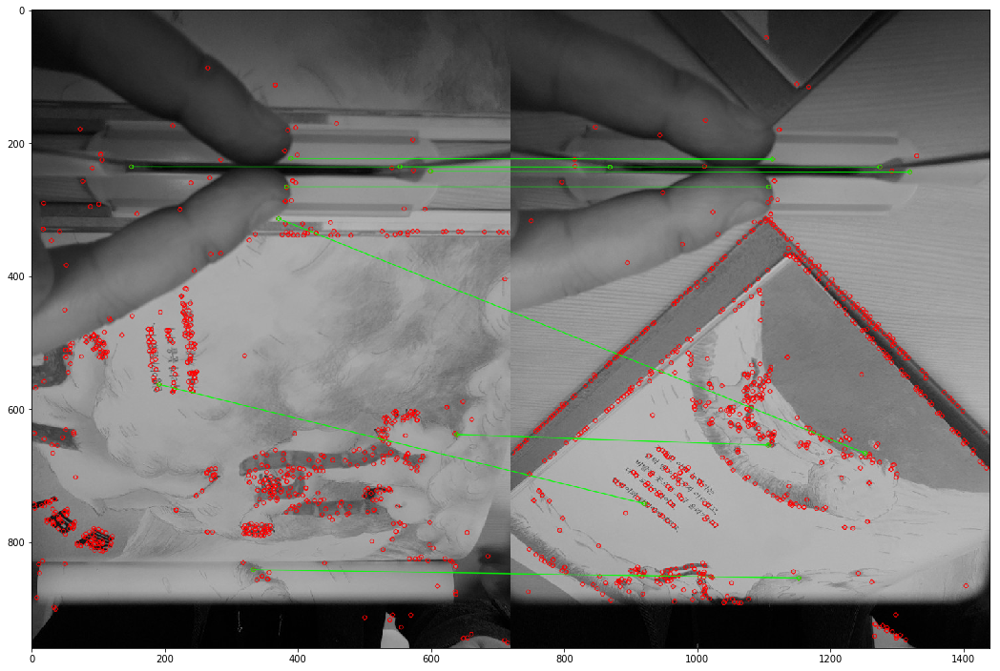

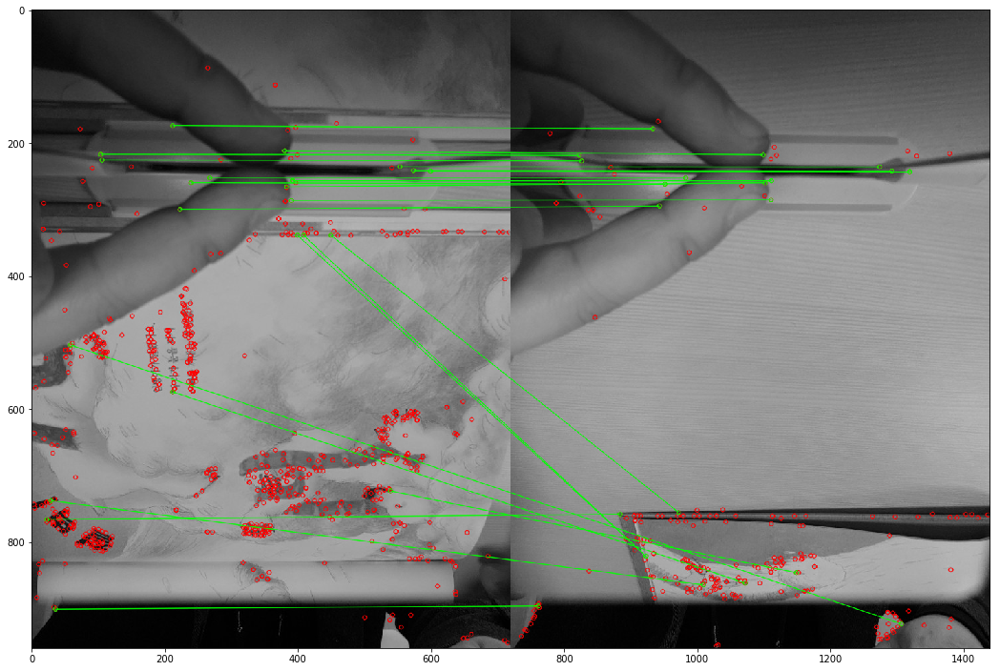

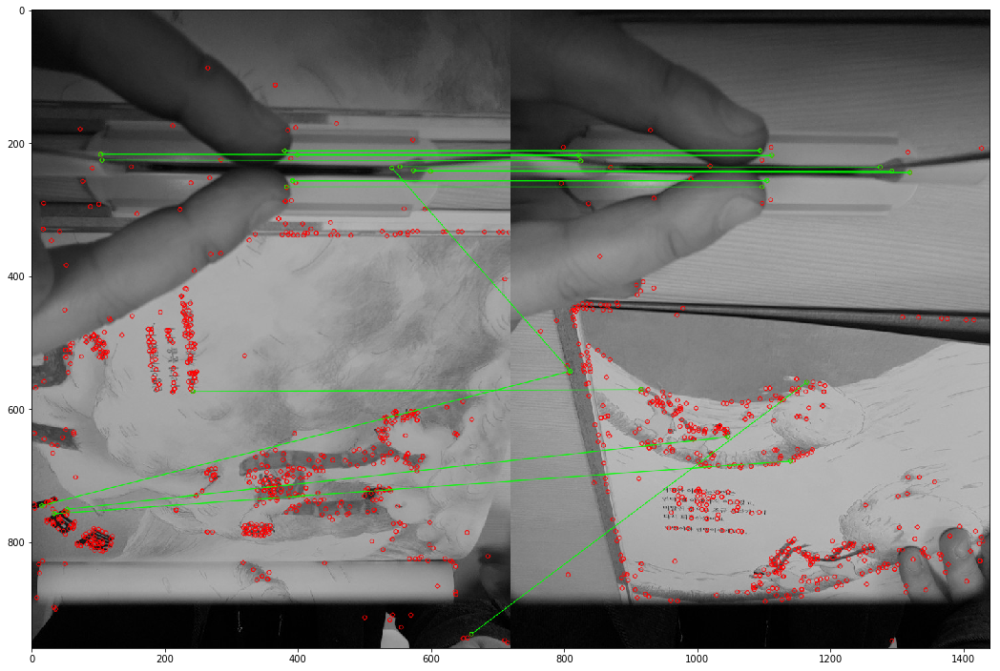

In [95]:
path_dir_1 = "..\\picture\\com_set2"
path_dir_2 = "..\\picture\\com_set3"
file_list_1 = os.listdir(path_dir_1)
file_list_2 = os.listdir(path_dir_2)

for i,j in enumerate(file_list_1):
    if i+1 >= len(file_list_1):
        break
    else: 
        fm_3(path_dir_1+"\\"+j,path_dir_2+"\\"+file_list_2[i+1])
    if i+2 >= len(file_list):
        break 
    else:
        fm_3(path_dir_1+"\\"+j,path_dir_2+"\\"+file_list_2[i+2])
    if i+3 >= len(file_list):
        break 
    else:
        fm_3(path_dir_1+"\\"+j,path_dir_2+"\\"+file_list_2[i+3])
    if i+4 >= len(file_list):
        break 
    else:
        fm_3(path_dir_1+"\\"+j,path_dir_2+"\\"+file_list_2[i+4])

# Feature classification

## scoring 
match_score를 통해 확인
minimum으로 threshold를 정해서 일치 여부 비교 

In [75]:
def match_score(im1,im2, func):
    original = cv.imread(im1,0)
    compare = cv.imread(im2,0)
    if str(func) == 'fm_2' :
        sift = cv.xfeatures2d.SIFT_create()

        kp1, des1 = sift.detectAndCompute(original,None)
        kp2, des2 = sift.detectAndCompute(compare,None)

        bf = cv.BFMatcher()
        matches = bf.knnMatch(des1,des2, k=2)

        good = []
        for m,n in matches:
            if m.distance < 0.75*n.distance:
                good.append([m])
                
        number_keypoints = 0
        if len(kp1) <= len(kp2):
            number_keypoints = len(kp1)
        else :
            number_keypoints = len(kp2)
        
        match_score = (len(good) / number_keypoints) * 100
        
        return match_score

    if str(func) == 'fm_3' :
        sift = cv.xfeatures2d.SIFT_create()

        kp1, des1 = sift.detectAndCompute(original,None)
        kp2, des2 = sift.detectAndCompute(compare,None)

        # FLANN parameters
        FLANN_INDEX_KDTREE = 1
        index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)
        search_params = dict(checks=100)   # or pass empty dictionary
        flann = cv.FlannBasedMatcher(index_params,search_params)
        matches = flann.knnMatch(des1,des2,k=2) # 2순위 매칭 결과까지 취함 

        # Need to draw only good matches, so create a mask
        matchesMask = [[0,0] for i in range(len(matches))]
        good = []

        number_keypoints = 0
        if len(kp1) <= len(kp2):
            number_keypoints = len(kp1)
        else :
            number_keypoints = len(kp2)


        # ratio test as per Lowe's paper
        for i,(m,n) in enumerate(matches):
            if m.distance < 0.68*n.distance:
                matchesMask[i]=[1,0]
                good.append(m)
    
        match_score = (len(good) / number_keypoints) * 100
    
        return match_score

In [35]:
print("score between unsimilar image : %s" %match_score('bear_real.png', 'no_bear.png', 'fm_2'),
      "score between scene image and real : %s" %match_score('bear_real.png', 'bear_in_scene.png', 'fm_3'),
      "score between same image : %s" %match_score('bear_real.png',"bear_real.png", "fm_3"), sep = "\n")

score between unsimilar image : 1.4066496163682864
score between scene image and real : 7.033248081841433
score between same image : 100.0


In [76]:
path_dir = "..\\picture\\com_set2"
file_list = os.listdir(path_dir)

for i,j in enumerate(file_list):
    if i+1 >= len(file_list):
        break
    else: 
        match_score(path_dir+"\\"+j,path_dir+"\\"+file_list[i+1],fm_2)